### Imports

In [1]:
import pandas as pd 
import numpy as np 

## Data Preparation

### basics

#### loading

In [2]:
### load all files individually
# current semester 
path="/Users/soenkedressler/Downloads/Text Analytics/HA_Text_Analytics/00-Data/"
df_1=pd.read_excel(path+"bereinigte_daten_gruppe_5.xlsx")
df_2=pd.read_excel(path+"Gruppe 1 Aufgabe 1 Lösung Loges.xlsx")
df_3=pd.read_excel(path+"analyst_gecrawled_unbereinigt.xlsx")
df_4=pd.read_excel(path+"data_indeed_schmidt_achim.xlsx")
df_5=pd.read_excel(path+"IndeedDaten_Gruppe4.xlsx")
df_6=pd.read_excel(path+"Data_G3-final.xlsx")
# previous semesters
df_7=pd.read_excel(path+"Stellenausschreibungen_2018.xlsx")
df_8=pd.read_excel(path+"Stellenausschreibungen_2019.xlsx")
df_9=pd.read_excel(path+"Stellenausschreibungen_2020_bereinigt.xlsx")
df_10=pd.read_excel(path+"Stellenausschreibungen_2021_HES.xlsx")
df_11=pd.read_excel(path+"Stellenausschreibungen_2022_HES.xlsx")

# data handling 
df_2=df_2.rename(columns={"Jobtitel":"Titel", "Firma":"Unternehmen", "Stellenbeschreibung":"Text"})
df_3=df_3.rename(columns={"Jobtitel":"Titel"})
df_4=df_4.rename(columns={"Jobtitel":"Titel", "Firma":"Unternehmen", "Beschreibung":"Text"})
df_2=df_2.filter(['Titel', 'Unternehmen', 'Text'])
df_4=df_4.filter(['Titel', 'Unternehmen', 'Text'])
df_10=df_10.filter(['Titel', 'Unternehmen', 'Text'])
df_11=df_11.filter(['Titel', 'Unternehmen', 'Text'])
# concat
include_semesters="current"
if include_semesters=="all":
    df_list_cur=[df_1,df_2,df_3,df_4,df_5,df_6]
    df_cur=pd.concat(df_list_cur)
    df_cur["Jahr"]=[int(2023) for i in range(len(df_cur))]
    df_7["Jahr"]=[int(2018) for i in range(len(df_7))]
    df_8["Jahr"]=[int(2019) for i in range(len(df_8))]
    df_9["Jahr"]=[int(2020) for i in range(len(df_9))]
    df_10["Jahr"]=[int(2021) for i in range(len(df_10))]
    df_11["Jahr"]=[int(2022) for i in range(len(df_11))]
    df_list=[df_cur,df_7, df_8,df_9,df_10,df_11]
    df=pd.concat(df_list)
    #df_list=[df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9,df_10,df_11]
elif include_semesters=="current":
    df_list=[df_1,df_2,df_3,df_4,df_5,df_6]
    df=pd.concat(df_list)

print("number of entries:", str(len(df)))
print("number of entries:", str(df.Text.nunique()))

number of entries: 1428
number of entries: 1336


#### drop eng

In [3]:
import pandas as pd
import langdetect

# Define a function to detect the language of a given string
def detect_language(text):
    try:
        return langdetect.detect(text)
    except:
        return None

# Filter out the rows with English text
df = df[df['Text'].apply(lambda x: detect_language(str(x)) != 'en')]


In [4]:
df

,Unternehmen,Titel,Text
0,Volkswagen Group Services GmbH,Business Intelligence Analyst (m/w/d),Stellenbeschreibung Anstellungsart Vollzeit Vo...
1,WIRmachenDRUCK GmbH,Junior Data Analyst - remote deutschlandweit,Stellenbeschreibung Anstellungsart Vollzeit Fe...
2,SIXT Germany,Business Analyst (m/w/d),\n Du begleitest die internationale Einführung...
3,YoungCapital,Data Analyst (m/w/d),Stellenbeschreibung Gehalt 17 € – 18 € pro Stu...
4,Siemens Healthineers,Data Analyst (w/m/d),Stellenbeschreibung Anstellungsart Vollzeit Te...
...,...,...,...
94,Küchenheld,Werkstudent Business Intelligence Analyst (w/m/d),Als Teil unseres Business Intelligence Teams b...
95,Gauselmann Group,Werkstudent Data Analytics / Datenbankenanalys...,"Tippen und gewinnen! Wetten, dass? Wir vermitt..."
96,Limberry,Werkstudent oder Praktikant (m/w/d) im Busines...,Du bist engagiert und möchtest deinen nächsten...
97,Grant Thornton AG,(Senior) Consultant als Security Operations Ce...,Kennziffer 2023-546 Einsatzort Düsseldorf Stel...


#### preprocessing

In [22]:
import pandas as pd
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
#import spacy

# function to preprocess text
def preprocess_text(text, index="x"):
    # remove numbers and punctuation
    text=str(text)
    text = re.sub(r'\d+', '', text)
    text = text.translate(str.maketrans('', '', string.punctuation))
    text = text.replace("\n"," ")
    text = text.replace("\n"," ")

    # lowercase text
    text = text.lower()

    # tokenize text into words
    words = nltk.word_tokenize(text)

    # remove stopwords
    stop_words = set(stopwords.words('german'))
    words = [word for word in words if word not in stop_words]

    # lemmatize words
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    index=str(index)
    if index!="x":
        words = [word for word in words if word!=df.Titel.iloc[int(index)]]
    #nlp = spacy.load('de_core_news_sm')
    #words = " ".join([token.lemma_ for token in nlp(words)])
    # join words back into a string
    text = ' '.join(words)
    if "hiring insight anzeigenaktivitäten" in text:
        text = text.split("hiring insight anzeigenaktivitäten")[0]
    if "stellenbeschreibung anstellungsart vollzeit vollständige stellenbeschreibung" in text:
        text = text.split("stellenbeschreibung anstellungsart vollzeit vollständige stellenbeschreibung")[1]

    return text

# apply preprocessing function to the text column in the dataframe
#df['text_processed'] = df['Text'].astype(str).apply(preprocess_text)
df_preprocessing=[]
for i, text in enumerate(df.Text):
    df_preprocessing.append(preprocess_text(text, i))
df['text_processed'] = df_preprocessing

#### preprocessing paragraphs

In [23]:
df["paragraphs"] = df["Text"].map(lambda text: re.split('[.?!]\s*\n', str(text)))
df_para=[]
for i, row in enumerate(df.paragraphs):
    row_list=[]
    for para in row:
        if para !="":
            text=preprocess_text(para)
            row_list.append(text)
    df_para.append(row_list)
df["paragraphs"]=df_para

#### shuffling

In [24]:
df=df.sample(frac=1)

In [25]:
df

,Unternehmen,Titel,Text,paragraphs,text_processed
337,Warner Music Central Europe,(Senior) Data Analyst:in (m/w/d),Das sind die Aufgaben \n \n \n \n Deine Missio...,[aufgaben mission kolleg innen mittels daten g...,aufgaben mission kolleg innen mittels daten ge...
173,The Manitowoc Company,Junior Financial Analyst (m/w/d),Ihre Aufgaben Erstellung von Kostenschätzungen...,[aufgaben erstellung kostenschätzungen sowie k...,aufgaben erstellung kostenschätzungen sowie ka...
298,The Manitowoc Company,Junior Financial Analyst (m/w/d),Stellenbeschreibung Anstellungsart Vollzeit Vo...,[ aufgaben erstellung kostenschätzungen sowie ...,aufgaben erstellung kostenschätzungen sowie k...
91,Jack Wolfskin,Web Analyst & Google Analytics Expert (m/w/d),We Live to Discover\n\nJack Wolfskin lebt für ...,[we live to discover jack wolfskin lebt entdec...,we live to discover jack wolfskin lebt entdeck...
62,Lekkerland SE,IT Test Analyst (m/w/d),Mach mit: Bei den Experten für intelligente E-...,[mach experten intelligente ecommerce lösungen...,mach experten intelligente ecommerce lösungen ...
...,...,...,...,...,...
343,Deutsche Bahn,IT Business Analyst für die Mobilitätsplattfor...,Als Mitarbeitende bei der DB Systel GmbH gesta...,[mitarbeitende db systel gmbh gestaltest aktiv...,mitarbeitende db systel gmbh gestaltest aktiv ...
287,interim Group,Data Analyst Power BI (m/w/d) bei der Informat...,Raise the Power of Data – Werde auch Du ein di...,[raise the power of data – digitaler schatzsuc...,raise the power of data – digitaler schatzsuch...
118,Saxenhammer & Co. International GmbH,Research Analyst / Associate (m/w/d),Stellenbeschreibung Anstellungsart Vollzeit Vo...,[ saxenhammer international tätige corporate f...,saxenhammer international tätige corporate fi...
226,Verivox GmbH,Business Analyst Value Added Services (m/w/d),Stellenbeschreibung Anstellungsart Vollzeit Vo...,[ hauptsitz heidelberg berlin mehrtägiger mobi...,hauptsitz heidelberg berlin mehrtägiger mobil...


#### length drop

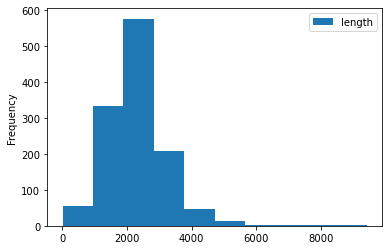

In [26]:
df["length"]=[len(i) for i in df.text_processed]
df.plot.hist()
df=df[(df.length<=4000)&(df.length>=600)]

<AxesSubplot:ylabel='Frequency'>

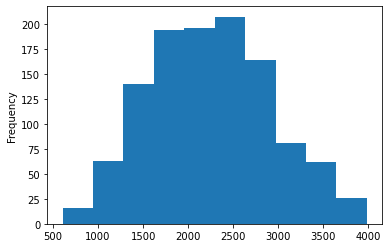

In [27]:
df.length.plot.hist()

In [28]:
df["text_processed"].iloc[0]

'aufgaben mission kolleg innen mittels daten gewonnener erkenntnisse besseren entscheidungen tagesgeschäft befähigen analysierst modellierst visualisierst digitale musiknutzungs zielgruppendaten gewonnenen insight vermittelst nichttechnische mitarbeiter innen prägnant nachvollziehbar bearbeitest adhoc anfragen agil berätst kolleg innen strategischen fragestellungen wiederkehrende analyse reportingprozesse automatisierst ganz selbstverständlich stehst engem austausch unserer internationalen research analytics community gesuchte profil hast studium bereich informatik natur sozial wirtschaftswissenschaften erfolgreich abgeschlossen kannst mehrjährige erfahrung data analytics data science funktion zurückblicken beherrschst sql sowie r undoder python visualisierst daten bi suite bestenfalls tableau denkst analytisch natur neugierig schaffst kommunikationsstärke umfeld welt daten begeistern musik leidenschaft hast ausgeprägtes interesse aktueller popkultur team interdisziplinären team denen 

### transformation of the text for Gensim 

#### transformation––words

In [29]:
import pandas as pd
import gensim
from gensim.utils import simple_preprocess

# convert text_processed column to a list of lists consisting of tokens 
df["text_processed_gensim"] = [simple_preprocess(line, deacc=True) for line in df['text_processed']]

# create a dictionary from the data ==> maps each unique token in the data to a unique integer ID 
df_dictionary_words = gensim.corpora.Dictionary(df["text_processed_gensim"])

# filter out words that are not in a min of 5 docs and are in less than 50 % of alle docs
df_dictionary_words.filter_extremes(no_below=5, no_above=0.5)

# create a corpus == bag-of-words from the data 
# ==> corpus = nested list of bag-of-words representations of each document 
# ==> each tuple contains the integer ID of a token and the count of that token in the document 
df_corpus_words = [df_dictionary_words.doc2bow(line) for line in df["text_processed_gensim"]]

/var/folders/cf/3v43348d3j18j8b2_9g5g18c0000gn/T/ipykernel_97500/3478325295.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["text_processed_gensim"] = [simple_preprocess(line, deacc=True) for line in df['text_processed']]


#### transformation––words (paragraphs)

In [30]:
import pandas as pd
import gensim
from gensim.utils import simple_preprocess

# create new paragraph df
id_list=[]
titel_list=[]
text_list=[]
for i, para in enumerate(df.paragraphs):
    for p in para:
        id_list.append(i)
        titel_list.append(df.Titel.iloc[i])
        text_list.append(p)
df_paragraph=pd.DataFrame(zip(id_list, titel_list,text_list), columns=["ID", "Titel", "text_processed"])

# convert text_processed column to a list of lists consisting of tokens 
df_paragraph["text_processed_gensim"] = [simple_preprocess(line, deacc=True) for line in df_paragraph['text_processed']]

# create a dictionary from the data ==> maps each unique token in the data to a unique integer ID 
df_dictionary_words_para = gensim.corpora.Dictionary(df_paragraph["text_processed_gensim"])

# filter out words that are not in a min of 5 docs and are in less than 50 % of alle docs
df_dictionary_words_para.filter_extremes(no_below=5, no_above=0.5)

# create a corpus == bag-of-words from the data 
# ==> corpus = nested list of bag-of-words representations of each document 
# ==> each tuple contains the integer ID of a token and the count of that token in the document 
df_corpus_words_para = [df_dictionary_words_para.doc2bow(line) for line in df_paragraph["text_processed_gensim"]]

#### transformation––bi-grams

In [31]:
import gensim
from gensim import corpora
import pandas as pd
from nltk import ngrams

# creating bi-grams using nltk 
df["text_processed_gensim_bi_grams"] = df["text_processed_gensim"].apply(lambda x: list(ngrams(x, 2)))

# formating the bi-grams using "_" (text1_text2) for preparation for gensim 
df["text_processed_gensim_bi_grams"] = df["text_processed_gensim_bi_grams"].apply(lambda x: ["{}_{}".format(w1, w2) for w1, w2 in x])

# create a dictionary from the bi-grams
df_dictionary_bi_grams = corpora.Dictionary(df["text_processed_gensim_bi_grams"])
df_dictionary_bi_grams.filter_extremes(no_below=5, no_above=0.5)

# create a corpus from the bi-grams
df_corpus_bi_grams = [df_dictionary_bi_grams.doc2bow(bi_grams) for bi_grams in df["text_processed_gensim_bi_grams"]]

/var/folders/cf/3v43348d3j18j8b2_9g5g18c0000gn/T/ipykernel_97500/456540119.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["text_processed_gensim_bi_grams"] = df["text_processed_gensim"].apply(lambda x: list(ngrams(x, 2)))
/var/folders/cf/3v43348d3j18j8b2_9g5g18c0000gn/T/ipykernel_97500/456540119.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["text_processed_gensim_bi_grams"] = df["text_processed_gensim_bi_grams"].apply(lambda x: ["{}_{}".format(w1, w2) for w1, w2 in x])


#### transformation––bi-grams (paragraphs)

In [32]:
import gensim
from gensim import corpora
import pandas as pd
from nltk import ngrams

# creating bi-grams using nltk 
df_paragraph["text_processed_gensim_bi_grams"] = df_paragraph["text_processed_gensim"].apply(lambda x: list(ngrams(x, 2)))

# formating the bi-grams using "_" (text1_text2) for preparation for gensim 
df_paragraph["text_processed_gensim_bi_grams"] = df_paragraph["text_processed_gensim_bi_grams"].apply(lambda x: ["{}_{}".format(w1, w2) for w1, w2 in x])

# create a dictionary from the bi-grams
df_dictionary_bi_grams_para = corpora.Dictionary(df_paragraph["text_processed_gensim_bi_grams"])
df_dictionary_bi_grams_para.filter_extremes(no_below=5, no_above=0.5)

# create a corpus from the bi-grams
df_corpus_bi_grams_para = [df_dictionary_bi_grams_para.doc2bow(bi_grams) for bi_grams in df_paragraph["text_processed_gensim_bi_grams"]]

#### checking

In [33]:
print("len of df-column: ", str(len(df.Text)))
print("len of df tokenized: ", str(len(df["text_processed_gensim"])))
print("len of df bi-gram: ", str(len(df["text_processed_gensim_bi_grams"])))
print("len of corpus (bow) –– words: ", str(len(df_corpus_words)))
print("len of corpus (bow) –– bi-grams: ", str(len(df_corpus_bi_grams)))
print("*********")

print("len of para df: ", str(len(df_paragraph.text_processed_gensim)))
print("*********")

print("checking of the tokenized text")
print(df["text_processed_gensim"][0:3])
print("*********")

print("checking of the b-grams")
print(df["text_processed_gensim_bi_grams"][0:3])
print("*********")

print("checking bow transformation –– words")
print(df_corpus_words[0])

print("checking bow transformation –– bi-grams")
print(df_corpus_bi_grams[0])

len of df-column:  1149
len of df tokenized:  1149
len of df bi-gram:  1149
len of corpus (bow) –– words:  1149
len of corpus (bow) –– bi-grams:  1149
*********
len of para df:  4570
*********
checking of the tokenized text
337    [aufgaben, mission, kolleg, innen, mittels, da...
173    [aufgaben, erstellung, sowie, kalkulation, ana...
298    [aufgaben, erstellung, sowie, kalkulation, ana...
Name: text_processed_gensim, dtype: object
*********
checking of the b-grams
337    [aufgaben_mission, mission_kolleg, kolleg_inne...
173    [aufgaben_erstellung, erstellung_sowie, sowie_...
298    [aufgaben_erstellung, erstellung_sowie, sowie_...
Name: text_processed_gensim_bi_grams, dtype: object
*********
checking bow transformation –– words
[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 2), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1

## LDA

### Execution with a handpicked number of topics (basis: Jobtitels)

#### topics –– words

distinct job titles

In [34]:
print(df.Titel.nunique())
print(df.Titel.value_counts())

852
Data Analyst (m/w/d)                                                                                                      22
Business Analyst (m/w/d)                                                                                                  17
Business Analyst (m/w/d)                                                                                                  13
Business Intelligence Analyst (m/w/d)                                                                                     11
Data Analyst (m/w/d)                                                                                                      10
                                                                                                                          ..
Analytiker / Analytics Consultant / Marktforscher (m/w/d) in der Abteilung Medienforschung und Analytics in Stuttgart      1
Business Analyst (m/w/d) Business Intelligence                                                                           

model creation

In [35]:
from gensim.models import LdaModel
lda_model_gensim_words = LdaModel(
    corpus=df_corpus_words, id2word=df_dictionary_words,
    chunksize=2000, alpha='auto', eta='auto', iterations=400, num_topics=30,
    passes=20, eval_every=None, random_state=42
    )

coherence score

In [36]:
from gensim.models.coherencemodel import CoherenceModel
lda_model_gensim_words_coherence = CoherenceModel(
    model=lda_model_gensim_words,
    texts=df["text_processed_gensim"], dictionary=df_dictionary_words, coherence='c_v'
    ) #c_uci

lda_model_gensim_words_coherence_score = lda_model_gensim_words_coherence.get_coherence() 

print(lda_model_gensim_words_coherence_score)

0.31940819246083235


show topics

In [37]:
for idx, topic in lda_model_gensim_words.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic))

Topic: 0 
Words: 0.012*"unite" + 0.011*"erfahrung" + 0.010*"business" + 0.009*"kunden" + 0.008*"verstandnis" + 0.008*"teil" + 0.008*"mehr" + 0.007*"verfugst" + 0.007*"hast" + 0.007*"wirtschaft"
Topic: 1 
Words: 0.008*"erfahrung" + 0.007*"service" + 0.006*"bewerbung" + 0.006*"hast" + 0.006*"unserer" + 0.005*"data" + 0.005*"daten" + 0.005*"reporting" + 0.004*"arbeitsweise" + 0.004*"bank"
Topic: 2 
Words: 0.012*"hast" + 0.011*"data" + 0.011*"unserer" + 0.011*"analytics" + 0.006*"kunden" + 0.006*"daten" + 0.005*"profil" + 0.005*"arbeitest" + 0.005*"neue" + 0.004*"erfahrung"
Topic: 3 
Words: 0.018*"and" + 0.017*"the" + 0.012*"to" + 0.009*"kunden" + 0.009*"we" + 0.008*"of" + 0.007*"with" + 0.006*"our" + 0.006*"hast" + 0.005*"data"
Topic: 4 
Words: 0.007*"zb" + 0.007*"erstellung" + 0.006*"erfahrung" + 0.006*"unternehmen" + 0.006*"unterstutzung" + 0.005*"sap" + 0.005*"berufserfahrung" + 0.005*"unserer" + 0.005*"abgeschlossenes" + 0.005*"bewerbung"
Topic: 5 
Words: 0.007*"suchen" + 0.006*"erste

visualization

In [38]:
# Import the necessary packages
import gensim
import pyLDAvis.gensim_models
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Visualize the LDA model using pyLDAvis
pyLDAvis.enable_notebook()
lda_visual = pyLDAvis.gensim_models.prepare(lda_model_gensim_words, df_corpus_words, df_dictionary_words)
pyLDAvis.display(lda_visual)

/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/soenkedressler/opt/anaconda3/lib/

#### topics –– words –– para

In [39]:
print(df_paragraph.Titel.nunique())
print(df_paragraph.Titel.value_counts())

852
Junior BI & Data Analyst E-Commerce (m/w/d)                                       125
Business Intelligence Analyst (m/w/d)                                             123
Data Analyst (m/w/d)                                                              121
Business Analyst (m/w/d)                                                          120
Instructional Designer & Data Analyst (m/w/d) KI-Campus                            81
                                                                                 ... 
Softwareentwickler (m/w/d)                                                          1
Group Accountant / Financial Analyst (m/w/d)                                        1
Data Analyst (m/w/d) mit Python und R – Düsseldorf - Ref. 25035 - KA Resources      1
IT - Business Analyst (m/w/d)                                                       1
Werkstudent (m/w/d) Data Analytics & Labeling (m/w/d)                               1
Name: Titel, Length: 852, dtype: int64


model creation

In [40]:
from gensim.models import LdaModel
lda_model_gensim_words_para = LdaModel(
    corpus=df_corpus_words_para, id2word=df_dictionary_words_para,
    chunksize=2000, alpha='auto', eta='auto', iterations=400, num_topics=30,
    passes=20, eval_every=None, random_state=42
    )

coherence score

In [41]:
from gensim.models.coherencemodel import CoherenceModel

lda_model_gensim_words_coherence_para = CoherenceModel(
    model=lda_model_gensim_words_para,
    texts=df["text_processed_gensim"], dictionary=df_dictionary_words_para, coherence='c_v'
    ) #c_uci

lda_model_gensim_words_coherence_score_para = lda_model_gensim_words_coherence_para.get_coherence() 

print(lda_model_gensim_words_coherence_score_para)

0.3565656003927214


show topics

In [42]:
for idx, topic in lda_model_gensim_words.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic))

Topic: 0 
Words: 0.012*"unite" + 0.011*"erfahrung" + 0.010*"business" + 0.009*"kunden" + 0.008*"verstandnis" + 0.008*"teil" + 0.008*"mehr" + 0.007*"verfugst" + 0.007*"hast" + 0.007*"wirtschaft"
Topic: 1 
Words: 0.008*"erfahrung" + 0.007*"service" + 0.006*"bewerbung" + 0.006*"hast" + 0.006*"unserer" + 0.005*"data" + 0.005*"daten" + 0.005*"reporting" + 0.004*"arbeitsweise" + 0.004*"bank"
Topic: 2 
Words: 0.012*"hast" + 0.011*"data" + 0.011*"unserer" + 0.011*"analytics" + 0.006*"kunden" + 0.006*"daten" + 0.005*"profil" + 0.005*"arbeitest" + 0.005*"neue" + 0.004*"erfahrung"
Topic: 3 
Words: 0.018*"and" + 0.017*"the" + 0.012*"to" + 0.009*"kunden" + 0.009*"we" + 0.008*"of" + 0.007*"with" + 0.006*"our" + 0.006*"hast" + 0.005*"data"
Topic: 4 
Words: 0.007*"zb" + 0.007*"erstellung" + 0.006*"erfahrung" + 0.006*"unternehmen" + 0.006*"unterstutzung" + 0.005*"sap" + 0.005*"berufserfahrung" + 0.005*"unserer" + 0.005*"abgeschlossenes" + 0.005*"bewerbung"
Topic: 5 
Words: 0.007*"suchen" + 0.006*"erste

visualization

In [43]:
# Import the necessary packages
import gensim
import pyLDAvis.gensim_models
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Visualize the LDA model using pyLDAvis
pyLDAvis.enable_notebook()
lda_visual = pyLDAvis.gensim_models.prepare(lda_model_gensim_words_para, df_corpus_words_para, df_dictionary_words_para)
pyLDAvis.display(lda_visual)

/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351

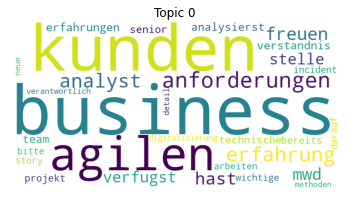

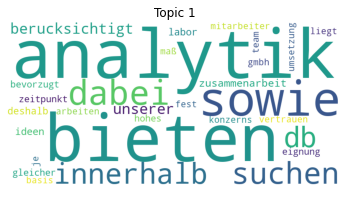

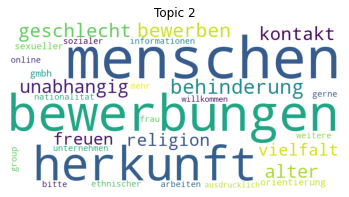

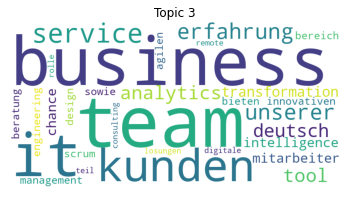

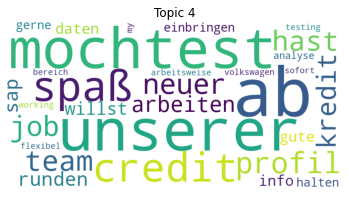

...

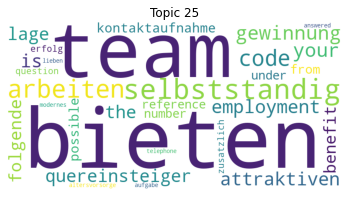

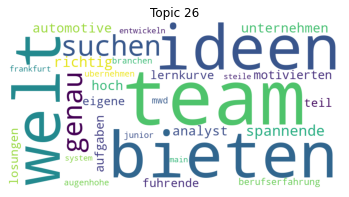

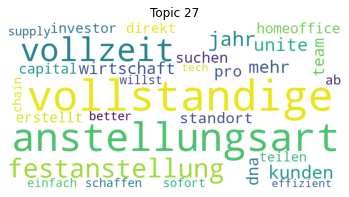

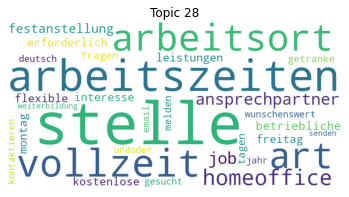

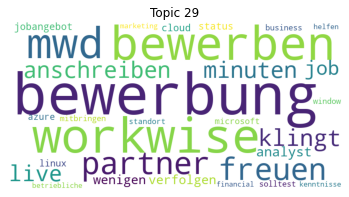

In [44]:
# Generate word clouds for each topic
for i in range(lda_model_gensim_words_para.num_topics):
    plt.figure()
    plt.imshow(WordCloud(background_color='white', width=800, height=400).fit_words(dict(lda_model_gensim_words_para.show_topic(i, 30))))
    plt.axis('off')
    plt.title('Topic {}'.format(i))
    plt.show()

#### topics –– bi-grams

model creation

In [45]:
from gensim.models import LdaModel

lda_model_gensim_bi_grams = LdaModel(
    corpus=df_corpus_bi_grams, id2word=df_dictionary_bi_grams,
    chunksize=2000, alpha='auto', eta='auto', iterations=400, num_topics=30,
    passes=20, eval_every=None, random_state=42
    )

coherence score

In [46]:
from gensim.models.coherencemodel import CoherenceModel
lda_model_gensim_bi_grams_coherence = CoherenceModel(
    model=lda_model_gensim_bi_grams,
    texts=df["text_processed_gensim"], dictionary=df_dictionary_bi_grams, coherence='c_uci'
    )

lda_model_gensim_bi_grams_coherence_score = lda_model_gensim_bi_grams_coherence.get_coherence() 

print(lda_model_gensim_bi_grams_coherence_score)

nan


show topics

In [47]:
for idx, topic in lda_model_gensim_bi_grams.print_topics(-1):
    if int(idx)<=10:
        print("Topic: {} \nWords: {}".format(idx, topic))

Topic: 0 
Words: 0.010*"sexueller_orientierung" + 0.009*"sozialer_herkunft" + 0.008*"abgeschlossenes_studium" + 0.007*"unabhangig_geschlecht" + 0.007*"gute_kenntnisse" + 0.007*"ethnischer_sozialer" + 0.007*"nationalitat_ethnischer" + 0.007*"alter_sowie" + 0.007*"sowie_sexueller" + 0.007*"flexible_arbeitszeiten"
Topic: 1 
Words: 0.010*"analyst_mwd" + 0.010*"flexible_arbeitszeiten" + 0.007*"nachstmoglichen_zeitpunkt" + 0.007*"supply_chain" + 0.006*"abgeschlossenes_studium" + 0.006*"betriebliche_altersvorsorge" + 0.005*"freuen_bewerbung" + 0.005*"wort_schrift" + 0.005*"interesse_geweckt" + 0.005*"suchen_nachstmoglichen"
Topic: 2 
Words: 0.011*"analyst_mwd" + 0.008*"freuen_bewerbung" + 0.008*"abgeschlossenes_studium" + 0.006*"standort_kornwestheim" + 0.006*"unserer_kunden" + 0.006*"mobile_arbeiten" + 0.005*"personliche_fachliche" + 0.005*"nachste_level" + 0.005*"data_warehouse" + 0.005*"analytische_fahigkeiten"
Topic: 3 
Words: 0.005*"betriebliche_altersvorsorge" + 0.004*"kapitel_hinzu" + 

visualization

In [48]:
# Import the necessary packages
import gensim
import pyLDAvis.gensim_models
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Visualize the LDA model using pyLDAvis
pyLDAvis.enable_notebook()
lda_visual = pyLDAvis.gensim_models.prepare(lda_model_gensim_bi_grams, df_corpus_bi_grams, df_dictionary_bi_grams)
pyLDAvis.display(lda_visual)

/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351

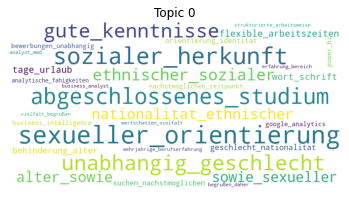

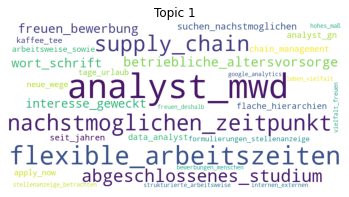

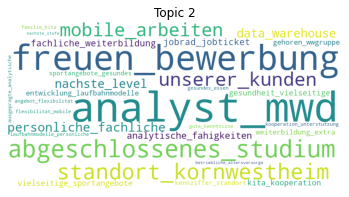

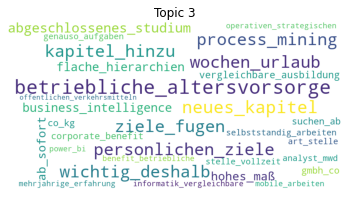

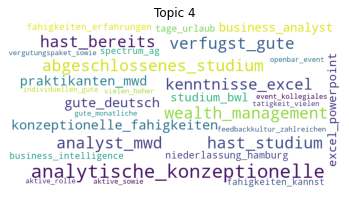

...

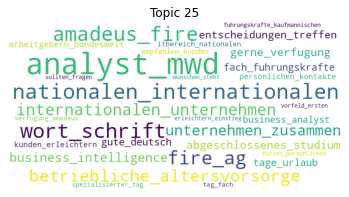

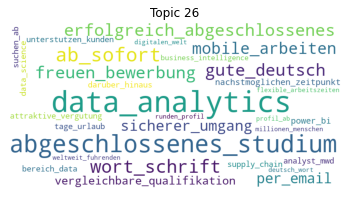

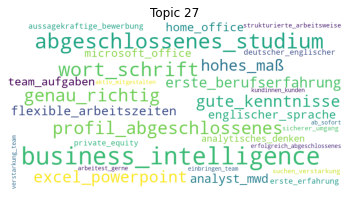

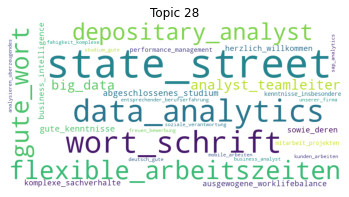

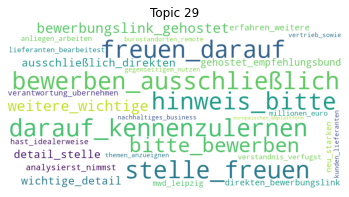

In [49]:
# Generate word clouds for each topic
for i in range(lda_model_gensim_bi_grams.num_topics):
    plt.figure()
    plt.imshow(WordCloud(background_color='white', width=800, height=400).fit_words(dict(lda_model_gensim_bi_grams.show_topic(i, 30))))
    plt.axis('off')
    plt.title('Topic {}'.format(i))
    plt.show()

#### topics –– bi-grams -– para

In [50]:
from gensim.models import LdaModel

lda_model_gensim_bi_grams_para = LdaModel(
    corpus=df_corpus_bi_grams_para, id2word=df_dictionary_bi_grams_para,
    chunksize=2000, alpha='auto', eta='auto', iterations=400, num_topics=30,
    passes=20, eval_every=None, random_state=42
    )

coherence score

In [51]:
from gensim.models.coherencemodel import CoherenceModel
lda_model_gensim_bi_grams_coherence_para = CoherenceModel(
    model=lda_model_gensim_bi_grams_para,
    texts=df["text_processed_gensim"], dictionary=df_dictionary_bi_grams_para, coherence='c_uci'
    )

lda_model_gensim_bi_grams_coherence_para_score = lda_model_gensim_bi_grams_coherence.get_coherence() 

print(lda_model_gensim_bi_grams_coherence_para_score)

nan


show topics

In [52]:
for idx, topic in lda_model_gensim_bi_grams_para.print_topics(-1):
    if int(idx)<=10:
        print("Topic: {} \nWords: {}".format(idx, topic))

Topic: 0 
Words: 0.010*"state_street" + 0.007*"ntt_data" + 0.007*"interessante_tatigkeit" + 0.006*"innerhalb_unserer" + 0.005*"data_analytics" + 0.005*"arbeitszeit_homeoffice" + 0.005*"tage_urlaub" + 0.005*"financial_service" + 0.004*"interne_externe" + 0.004*"remote_work"
Topic: 1 
Words: 0.046*"data_analytics" + 0.028*"data_science" + 0.016*"data_scientist" + 0.015*"bereich_data" + 0.014*"jahre_berufserfahrung" + 0.011*"machine_learning" + 0.011*"teil_team" + 0.009*"berufserfahrung_bereich" + 0.008*"microsoft_azure" + 0.007*"hr_manager"
Topic: 2 
Words: 0.013*"freuen_darauf" + 0.012*"darauf_kennenzulernen" + 0.011*"freuen_kennenzulernen" + 0.010*"analyst_mwd" + 0.010*"stelle_freuen" + 0.010*"hinweis_bitte" + 0.008*"bitte_bewerben" + 0.008*"bewerben_ausschließlich" + 0.008*"weitere_wichtige" + 0.008*"ausschließlich_direkten"
Topic: 3 
Words: 0.014*"talent_acquisition" + 0.013*"of_the" + 0.011*"betriebliche_altersvorsorge" + 0.010*"anspruchsvolle_aufgaben" + 0.009*"enge_zusammenarbeit"

visualization

In [53]:
# Import the necessary packages
import gensim
import pyLDAvis.gensim_models
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Visualize the LDA model using pyLDAvis
pyLDAvis.enable_notebook()
lda_visual = pyLDAvis.gensim_models.prepare(lda_model_gensim_bi_grams_para, df_corpus_bi_grams_para, df_dictionary_bi_grams_para)
pyLDAvis.display(lda_visual)

/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351

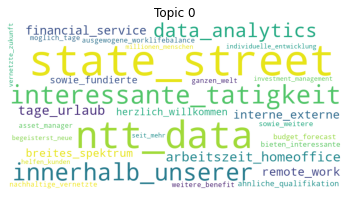

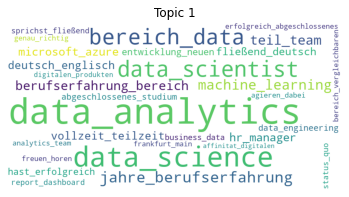

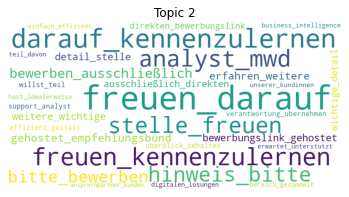

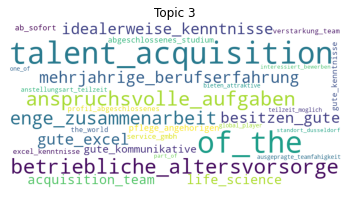

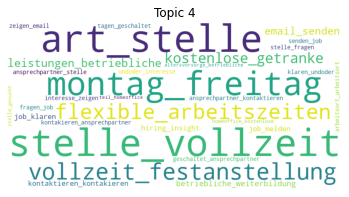

...

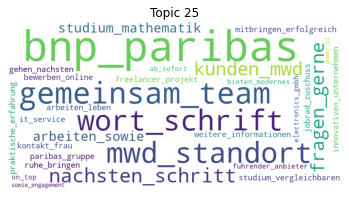

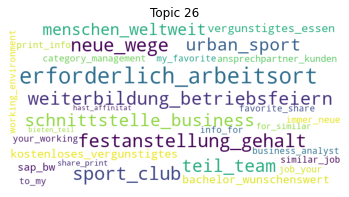

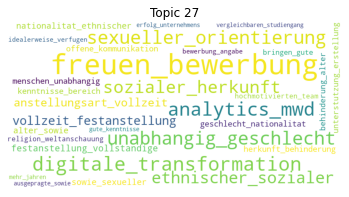

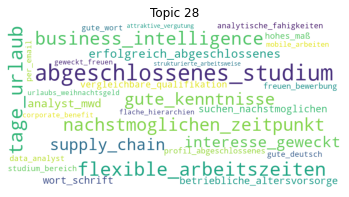

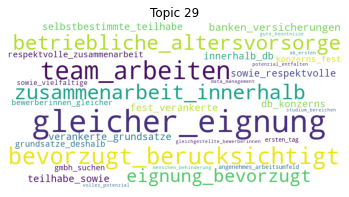

In [54]:
# Generate word clouds for each topic
for i in range(lda_model_gensim_bi_grams_para.num_topics):
    plt.figure()
    plt.imshow(WordCloud(background_color='white', width=800, height=400).fit_words(dict(lda_model_gensim_bi_grams_para.show_topic(i, 30))))
    plt.axis('off')
    plt.title('Topic {}'.format(i))
    plt.show()

### Execution with coherence score

#### words

coherence score for choosing the number of topics

In [55]:
from gensim.models.ldamulticore import LdaMulticore 
from tqdm import tqdm

lda_para_model_n = []
for n in tqdm(range(10, 201, 10)):
    lda_model = LdaMulticore(
        corpus=df_corpus_words, id2word=df_dictionary_words,
        chunksize=2000, eta='auto', iterations=400,
        num_topics=n, passes=20, eval_every=None,
        random_state=42
        )
    lda_coherence = CoherenceModel(model=lda_model, texts=df["text_processed_gensim"], dictionary=df_dictionary_words, coherence='c_v')
    lda_para_model_n.append((n, lda_model, lda_coherence.get_coherence()))

  5%|▌         | 1/20 [01:15<23:59, 75.76s/it]


KeyboardInterrupt: 

visialization 

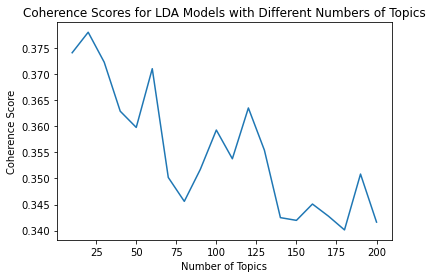

In [ ]:
import matplotlib.pyplot as plt

# Extract the number of topics and coherence scores from the results
num_topics = [x[0] for x in lda_para_model_n]
coherence_scores = [x[2] for x in lda_para_model_n]

# Create a line plot of coherence scores versus number of topics
plt.plot(num_topics, coherence_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Scores for LDA Models with Different Numbers of Topics")
plt.show()

In [ ]:
from gensim.models.ldamulticore import LdaMulticore 
from tqdm import tqdm

lda_para_model_n_c_v = []
for n in tqdm(range(10, 201, 10)):
    lda_model = LdaMulticore(
        corpus=df_corpus_words, id2word=df_dictionary_words,
        chunksize=2000, eta='auto', iterations=400,
        num_topics=n, passes=20, eval_every=None,
        random_state=42
        )
    lda_coherence = CoherenceModel(model=lda_model, texts=df["text_processed_gensim"], dictionary=df_dictionary_words, coherence='c_uci')
    lda_para_model_n_c_v.append((n, lda_model, lda_coherence.get_coherence()))

 25%|██▌       | 5/20 [06:51<20:35, 82.40s/it]


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt

# Extract the number of topics and coherence scores from the results
num_topics = [x[0] for x in lda_para_model_n_uci]
coherence_scores = [x[2] for x in lda_para_model_n_uci]

# Create a line plot of coherence scores versus number of topics
plt.plot(num_topics, coherence_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Scores for LDA Models with Different Numbers of Topics")
plt.show()

choosing the number of topis

In [ ]:
num_topics=60

LDA for that number

In [ ]:
from gensim.models import LdaModel
lda_model_gensim_words = LdaModel(
    corpus=df_corpus_words, id2word=df_dictionary_words,
    chunksize=2000, alpha='auto', eta='auto', iterations=400, num_topics=num_topics,
    passes=20, eval_every=None, random_state=42
    )

visualization

In [ ]:
# Import the necessary packages
import gensim
import pyLDAvis.gensim_models
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Visualize the LDA model using pyLDAvis
pyLDAvis.enable_notebook()
lda_visual = pyLDAvis.gensim_models.prepare(lda_model_gensim_words, df_corpus_words, df_dictionary_words)
pyLDAvis.display(lda_visual)

/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationW

#### para

coherence score for choosing the number of topics

In [ ]:
from gensim.models.ldamulticore import LdaMulticore 
from tqdm import tqdm

lda_para_model_n = []
for n in tqdm(range(10, 201, 10)):
    lda_model = LdaMulticore(
        corpus=df_corpus_words, id2word=df_dictionary_words,
        chunksize=2000, eta='auto', iterations=400,
        num_topics=n, passes=20, eval_every=None,
        random_state=42
        )
    lda_coherence = CoherenceModel(model=lda_model, texts=df["text_processed_gensim"], dictionary=df_dictionary_words, coherence='c_v')
    lda_para_model_n.append((n, lda_model, lda_coherence.get_coherence()))

100%|██████████| 20/20 [30:36<00:00, 91.82s/it] 


visialization 

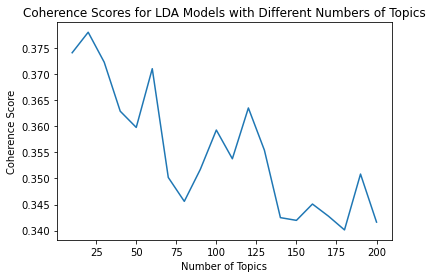

In [ ]:
import matplotlib.pyplot as plt

# Extract the number of topics and coherence scores from the results
num_topics = [x[0] for x in lda_para_model_n]
coherence_scores = [x[2] for x in lda_para_model_n]

# Create a line plot of coherence scores versus number of topics
plt.plot(num_topics, coherence_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Scores for LDA Models with Different Numbers of Topics")
plt.show()

In [ ]:
from gensim.models.ldamulticore import LdaMulticore 
from tqdm import tqdm

lda_para_model_n_c_v = []
for n in tqdm(range(10, 201, 10)):
    lda_model = LdaMulticore(
        corpus=df_corpus_words, id2word=df_dictionary_words,
        chunksize=2000, eta='auto', iterations=400,
        num_topics=n, passes=20, eval_every=None,
        random_state=42
        )
    lda_coherence = CoherenceModel(model=lda_model, texts=df["text_processed_gensim"], dictionary=df_dictionary_words, coherence='c_uci')
    lda_para_model_n_c_v.append((n, lda_model, lda_coherence.get_coherence()))

 25%|██▌       | 5/20 [06:51<20:35, 82.40s/it]


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt

# Extract the number of topics and coherence scores from the results
num_topics = [x[0] for x in lda_para_model_n_uci]
coherence_scores = [x[2] for x in lda_para_model_n_uci]

# Create a line plot of coherence scores versus number of topics
plt.plot(num_topics, coherence_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Scores for LDA Models with Different Numbers of Topics")
plt.show()

choosing the number of topis

In [56]:
num_topics=60

LDA for that number

In [ ]:
from gensim.models import LdaModel
lda_model_gensim_words = LdaModel(
    corpus=df_corpus_words, id2word=df_dictionary_words,
    chunksize=2000, alpha='auto', eta='auto', iterations=400, num_topics=num_topics,
    passes=20, eval_every=None, random_state=42
    )

visualization

In [ ]:
# Import the necessary packages
import gensim
import pyLDAvis.gensim_models
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Visualize the LDA model using pyLDAvis
pyLDAvis.enable_notebook()
lda_visual = pyLDAvis.gensim_models.prepare(lda_model_gensim_words, df_corpus_words, df_dictionary_words)
pyLDAvis.display(lda_visual)

/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/soenkedressler/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationW

## Clustering

### Data Prepration after LDA

#### Words

In [59]:
import gensim
from gensim import corpora, models

# get document-topic representation for each document
doc_topic_df_list = []
for index, i in enumerate(df["text_processed_gensim"]):
    doc_bow = df_dictionary_words.doc2bow(i)
    doc_topics = lda_model_gensim_words.get_document_topics(bow=doc_bow)
    doc_top_df=pd.DataFrame(doc_topics, columns=["topic", "score"])
    doc_top_df["doc_num"]=[index for x in range(len(doc_top_df))]
    doc_topic_df_list.append(doc_top_df)

doc_topic_matrix_word = pd.concat(doc_topic_df_list)
doc_topic_matrix_word["topic"]=doc_topic_matrix_word["topic"]+1
doc_topic_matrix_word=doc_topic_matrix_word.pivot_table(index="doc_num", columns="topic", values="score").fillna(0).reset_index()

In [60]:
doc_topic_matrix_word

topic,doc_num,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
0,0,0.0,0.0,0.997003,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.991203,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2,0.0,0.0,0.000000,0.000000,0.0,0.0,0.991203,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,3,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.267647,0.0,0.000000,0.000000,0.000000,0.547735,0.000000,0.083210,0.000000
4,4,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.256376,0.147942,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,1144,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.266448,0.0,0.150739,0.000000,0.000000,0.073633,0.000000,0.000000,0.000000
1145,1145,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.515613,0.000000,0.423155
1146,1146,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.325749,0.000000,0.000000,0.000000,0.138823,0.000000
1147,1147,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


#### Paragraphs

In [89]:
import gensim
from gensim import corpora, models

# get document-topic representation for each document
doc_topic_df_list = []
for index, i in enumerate(df_paragraph["text_processed_gensim"]):
    doc_bow = df_dictionary_words.doc2bow(i)
    doc_topics = lda_model_gensim_words.get_document_topics(bow=doc_bow)
    doc_top_df=pd.DataFrame(doc_topics, columns=["topic", "score"])
    doc_top_df["doc_num"]=[df_paragraph.ID[index] for x in range(len(doc_top_df))]
    doc_topic_df_list.append(doc_top_df)

doc_topic_matrix_para = pd.concat(doc_topic_df_list)
doc_topic_matrix_para["topic"]=doc_topic_matrix_para["topic"]+1

doc_topic_matrix_para
doc_topic_matrix_para=doc_topic_matrix_para.pivot_table(index="doc_num", columns="topic", values="score", aggfunc=lambda x: x.sum()/len(x)).fillna(0).reset_index()

In [90]:
doc_topic_matrix_para

topic,doc_num,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
0,0,0.030138,0.028538,0.674876,0.027454,0.037861,0.049237,0.036941,0.036716,0.025609,...,0.024212,0.032044,0.025854,0.036475,0.047307,0.030323,0.031149,0.035793,0.036354,0.041043
1,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.991203,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2,0.030138,0.028538,0.036791,0.027454,0.037861,0.049237,0.514072,0.036716,0.025609,...,0.024212,0.032044,0.025854,0.036475,0.047307,0.030323,0.031149,0.035793,0.036354,0.041043
3,3,0.168629,0.552167,0.000000,0.172070,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.420324,0.000000,0.000000,0.000000,0.000000,0.659332,0.000000,0.104530,0.000000
4,4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.256371,0.147948,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,1144,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.266451,0.000000,0.150725,0.000000,0.000000,0.073630,0.000000,0.000000,0.000000
1145,1145,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.515613,0.000000,0.423155
1146,1146,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.325736,0.000000,0.000000,0.000000,0.138819,0.000000
1147,1147,0.325656,0.010589,0.013652,0.010187,0.014048,0.018269,0.013707,0.013624,0.000000,...,0.000000,0.011890,0.000000,0.013534,0.017554,0.011252,0.011558,0.013281,0.013489,0.015229


### visulatization of the doc-topic data

#### PCA –– words

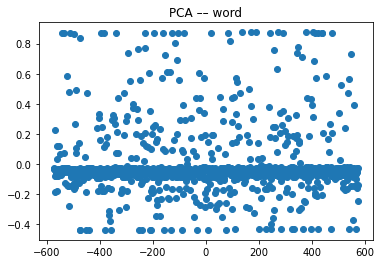

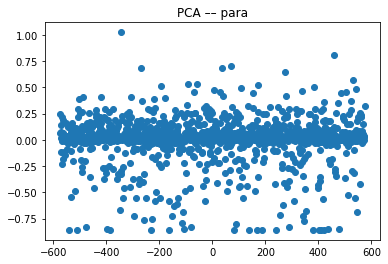

In [119]:
# Reduce dimensionality of document-topic representation using t-SNE
pca_model = PCA(n_components=2)
doc_topic_pca_word = pca_model.fit_transform(doc_topic_matrix_word)
doc_topic_pca_para = pca_model.fit_transform(doc_topic_matrix_para)

# Plot the results
plt.scatter(doc_topic_pca_word[:, 0], doc_topic_pca_word[:, 1])
plt.title("PCA –– word")
plt.show()

plt.scatter(doc_topic_pca_para[:, 0], doc_topic_pca_para[:, 1])
plt.title("PCA –– para")
plt.show()

#### TSNE –– words

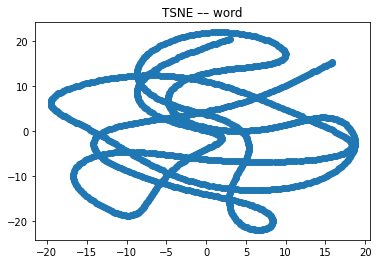

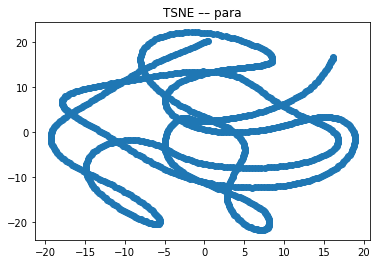

In [118]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Reduce dimensionality of document-topic representation using t-SNE
tsne_model = TSNE(n_components=3, random_state=0, perplexity=10, learning_rate=10, n_iter=4000)
doc_topic_tsne_word = tsne_model.fit_transform(doc_topic_matrix_word)
doc_topic_tsne_para = tsne_model.fit_transform(doc_topic_matrix_para)


# Plot the results
plt.scatter(doc_topic_tsne_word[:, 0], doc_topic_tsne_word[:, 1])
plt.title("TSNE –– word")
plt.show()

plt.scatter(doc_topic_tsne_para[:, 0], doc_topic_tsne_para[:, 1])
plt.title("TSNE –– para")
plt.show()

### k-means

#### model and parameters 

In [ ]:
from sklearn.cluster import KMeans #Bisecting

# Use document-topic representation as input for k-means clustering
kmeans = KMeans(n_clusters=10, random_state=0, ).fit(doc_topic_matrix)

#### gerneral evaluation of the results 

visual

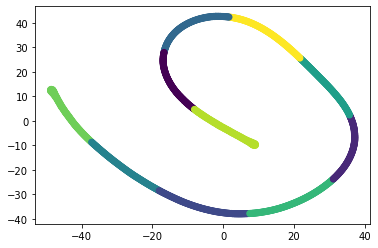

In [ ]:
from sklearn.manifold import TSNE
# Reduce dimensionality of document-topic representation using t-SNE
tsne_model = TSNE(n_components=2, random_state=0)
doc_topic_tsne = tsne_model.fit_transform(doc_topic_matrix)

# Plot the results
plt.scatter(doc_topic_tsne[:, 0], doc_topic_tsne[:, 1], c=kmeans.labels_)
plt.show()

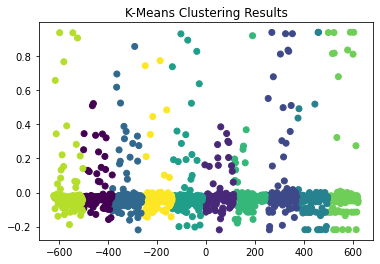

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Perform PCA on the data
pca = PCA(n_components=2)
X_pca = pca.fit_transform(doc_topic_matrix)

# Plot the results
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_)
plt.title('K-Means Clustering Results')
plt.show()

cluster size 

metrics

In [ ]:
import pandas as pd
import gensim
from gensim import corpora, models
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.metrics import pairwise_distances
import numpy as np
import math

# Calculate f1-score
labels_true = df["True Labels"]
labels_pred = clustering.labels_
f_score = f1_score(labels_true, labels_pred, average='weighted')

# Calculate confusion matrix
confusion_mtx = confusion_matrix(labels_true, labels_pred)

# Calculate cohesion and separation
dists = pairwise_distances(doc_topic, metric='euclidean')
avg_dist = np.mean(dists)
intra_cluster_dists = np.zeros(clustering.n_clusters)
inter_cluster_dists = np.zeros(clustering.n_clusters)
for i in range(clustering.n_clusters):
    indices = np.where(clustering.labels_ == i)[0]
    cluster_dists = dists[np.ix_(indices, indices)]
    intra_cluster_dists[i] = np.mean(cluster_dists)
    other_cluster_dists = dists[np.ix_(indices, np.where(clustering.labels_ != i)[0])]
    inter_cluster_dists[i] = np.mean(other_cluster_dists)
cohesion = np.mean(intra_cluster_dists)
separation = np.mean(inter_cluster_dists)

# Calculate entropy
entropy = 0
for i in range(clustering.n_clusters):
    indices = np.where(clustering.labels_ == i)[0]
    p_i = len(indices) / len(clustering.labels_)
    if p_i > 0:
        entropy_i = -p_i * np.sum(np.log(p_i))
    else:
        entropy_i = 0
    entropy += entropy_i

# Print evaluation metrics
print("F-score:", f_score)
print("Confusion matrix:")
print(confusion_mtx)
print("Cohesion:", cohesion)
print("Separation:", separation)
print("Entropy:", entropy)

KeyError: 'True Labels'

topics in the clusters 

crossovers

### spectral clustering

#### silhouette score for choosing the number of cluster 

In [134]:
from sklearn.metrics import silhouette_score
# Use silhouette method to choose number of clusters for spectral clustering
n_clusters_list=[]
silhouette_scores = []
sse_values=[]
for n_clusters in range(10, 101, 10):
    #spectral = SpectralClustering(n_clusters=n_clusters, random_state=0)
    #spectral = SpectralClustering(n_clusters=n_clusters, random_state=0)
    #cluster_labels = spectral.fit_predict(doc_topic_matrix_word)

    k_means = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels = k_means.fit_predict(doc_topic_matrix_word)
    silhouette_avg = silhouette_score(doc_topic_matrix_word, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    sse_values.append(k_means.inertia_)
    n_clusters_list.append(n_clusters)
# Choose number of clusters based on silhouette scores
n_clusters_silh = n_clusters_list[silhouette_scores.index(max(silhouette_scores))] 
print("number of silhouette_score clusters: ", str(n_clusters_silh))

# choose number of clusters based on jobtitels 
n_clusters_hand = 10
print("number of handpicked clusters: ", str(n_clusters_hand))

number of silhouette_score clusters:  10
number of handpicked clusters:  10


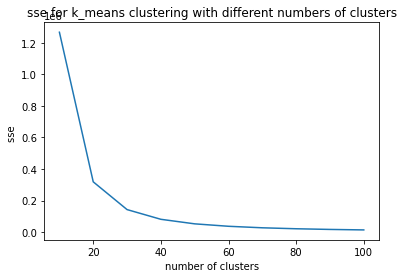

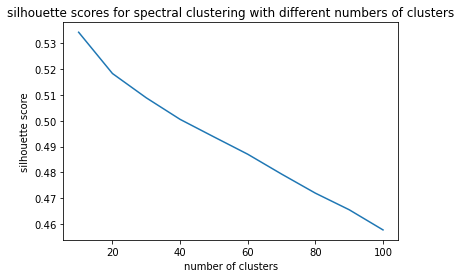

In [136]:
import matplotlib.pyplot as plt

# Extract the number of topics and coherence scores from the results
num_clusters = [x for x in range(10, 101, 10)]

# Create a line plot of SSE scores versus number of clusters
plt.plot(num_clusters, sse_values)
plt.xlabel("number of clusters")
plt.ylabel("sse ")
plt.title("sse for k_means clustering with different numbers of clusters")
plt.show()

# Create a line plot of silhouette scores versus number of clusters
plt.plot(num_clusters, silhouette_scores)
plt.xlabel("number of clusters")
plt.ylabel("silhouette score")
plt.title("silhouette scores for spectral clustering with different numbers of clusters")
plt.show()

In [137]:
n_clusters=20

#### model and parameters 

In [138]:
from sklearn.cluster import SpectralClustering

# Use document-topic representation as input for spectral clustering
spectral_word = SpectralClustering(n_clusters=n_clusters, random_state=0, affinity='rbf', n_neighbors=10).fit(doc_topic_matrix_word)
spectral_para = SpectralClustering(n_clusters=n_clusters, random_state=0, affinity='rbf', n_neighbors=10).fit(doc_topic_matrix_para)

#### 2D-visual -- TSNE 

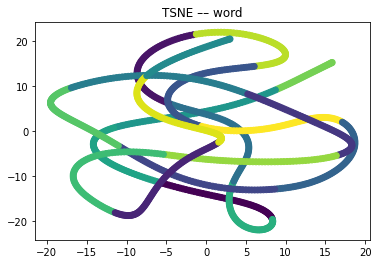

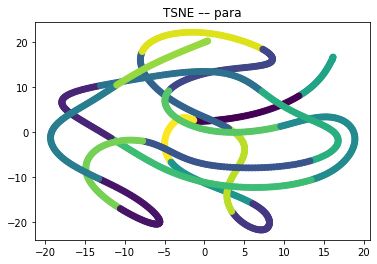

In [140]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Reduce dimensionality of document-topic representation using t-SNE
tsne_model = TSNE(n_components=3, random_state=0, perplexity=10, learning_rate=10, n_iter=4000)
doc_topic_tsne_word = tsne_model.fit_transform(doc_topic_matrix_word)
doc_topic_tsne_para = tsne_model.fit_transform(doc_topic_matrix_para)


# Plot the results
plt.scatter(doc_topic_tsne_word[:, 0], doc_topic_tsne_word[:, 1], c=spectral_word.labels_)
plt.title("TSNE –– word")
plt.show()

plt.scatter(doc_topic_tsne_para[:, 0], doc_topic_tsne_para[:, 1], c=spectral_para.labels_)
plt.title("TSNE –– para")
plt.show()

#### 2D-visual –– PCA

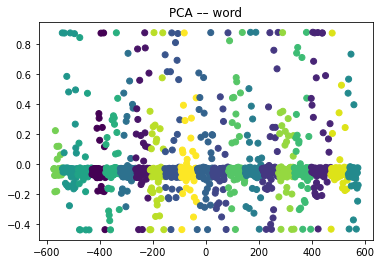

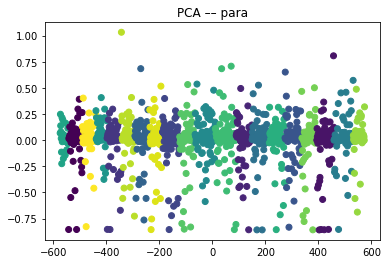

In [141]:
# Reduce dimensionality of document-topic representation using t-SNE
pca_model = PCA(n_components=2)
doc_topic_pca_word = pca_model.fit_transform(doc_topic_matrix_word)
doc_topic_pca_para = pca_model.fit_transform(doc_topic_matrix_para)

# Plot the results
plt.scatter(doc_topic_pca_word[:, 0], doc_topic_pca_word[:, 1], c=spectral_word.labels_)
plt.title("PCA –– word")
plt.show()

plt.scatter(doc_topic_pca_para[:, 0], doc_topic_pca_para[:, 1], c=spectral_para.labels_)
plt.title("PCA –– para")
plt.show()

#### 3D-visual –– TSNE/PCA

In [142]:
import numpy as np
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# perform PCA on the data
pca = PCA(n_components=3)
X_pca = pca.fit_transform(doc_topic_matrix_para)

# perform TSNE on the data
tsne_model = TSNE(n_components=3, random_state=0, perplexity=10, learning_rate=10, n_iter=4000)
doc_topic_tsne = tsne_model.fit_transform(doc_topic_matrix_para)

# choose between TSNE and PCA for the visual 
#X_pca=doc_topic_tsne

# choose word or para data
spectral=spectral_para

# Create a trace for each cluster
traces = []
for i in range(spectral.n_clusters):
    cluster_idx = np.where(spectral.labels_ == i)[0]
    trace = go.Scatter3d(
        x=X_pca[cluster_idx, 0],
        y=X_pca[cluster_idx, 1],
        z=X_pca[cluster_idx, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=i,
            colorscale='Viridis',
            opacity=0.8
        ),
        name='Cluster {}'.format(i)
    )
    traces.append(trace)

# create the layout for the plot
layout = go.Layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    )
)

# create the figure and plot the traces
go.Figure(data=traces, layout=layout).show()

# save the plot as offline html file 
import plotly.offline as pyo
pyo.plot(go.Figure(data=traces, layout=layout), filename='3d-plot.html')

'3d-plot.html'

#### gerneral evaluation of the results 

cluster size 

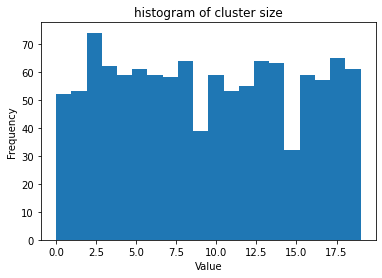

In [165]:
# word data
cluster_labels_word = spectral_word.labels_
doc_topic_matrix_word["cluster_id"]=cluster_labels_word
#doc_topic_matrix_word["cluster_id"].plot.hist()
plt.hist(doc_topic_matrix_word.filter(["cluster_id"]), bins=n_clusters)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('histogram of cluster size')
plt.show()
# para data
cluster_labels_para = spectral_para.labels_
doc_topic_matrix_para["cluster_id"]=cluster_labels_para
#doc_topic_matrix_para["cluster_id"].plot.hist()

naming the clusters

In [301]:
# word data
cluster_names_df_word=df.copy()
cluster_names_df_word["cluster_id"]=cluster_labels_word

cluster_names_word={}
for cluster in np.unique(cluster_labels_word):
    main_job=pd.DataFrame(cluster_names_df_word[["Titel", "cluster_id"]][cluster_names_df_word["cluster_id"]==cluster].value_counts()).reset_index().iloc[0,0]
    cluster_names[cluster]=main_job
cluster_names_df_word["cluster_name"]=[cluster_names[i] for i in cluster_names_df_word.cluster_id]
cluster_names_df_word["true"]=[1 for i in range(len(cluster_names_df_word))]
cluster_names_df_word["pred"]=[1 if cluster_names_df_word["Titel"].iloc[i]==cluster_names_df_word["cluster_name"].iloc[i] else 0 for i in range(len(cluster_names_df_word))]

# word para
cluster_names_df_para=df.copy()
cluster_names_df_para["cluster_id"]=cluster_labels_para

cluster_names_para={}
for cluster in np.unique(cluster_labels_para):
    main_job=pd.DataFrame(cluster_names_df_para[["Titel", "cluster_id"]][cluster_names_df_para["cluster_id"]==cluster].value_counts()).reset_index().iloc[0,0]
    cluster_names_para[cluster]=main_job
cluster_names_df_para["cluster_name"]=[cluster_names[i] for i in cluster_names_df_para.cluster_id]
cluster_names_df_para["true"]=[1 for i in range(len(cluster_names_df_para))]
cluster_names_df_para["pred"]=[1 if cluster_names_df_para["Titel"].iloc[i]==cluster_names_df_para["cluster_name"].iloc[i] else 0 for i in range(len(cluster_names_df_para))]

metrics

In [ ]:
import pandas as pd
import gensim
from gensim import corpora, models
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.metrics import pairwise_distances
import numpy as np
import math

In [309]:
# setting labels
from sklearn.preprocessing import LabelEncoder
labels_true = list(cluster_names_df_word.true)
labels_pred = list(cluster_names_df_word.pred)

# calculate confusion matrix
confusion_mtx = confusion_matrix(labels_true, labels_pred)

In [310]:
# calculate f1-score
f_score = f1_score(labels_true, labels_pred, average='weighted')
print(f_score)

0.07052896725440806


In [311]:
# get TP, TN, FP, FN values
TP = confusion_mtx[1][1] 
TN = confusion_mtx[0][0]
FP = confusion_mtx[0][1]
FN = confusion_mtx[1][0]

ACC = (TP+TN)/(TP+FP+FN+TN)

print("True Positive (TP):", TP)
print("True Negative (TN):", TN)
print("False Positive (FP):", FP)
print("False Negative (FN):", FN)

print("Accuracy (ACC):", ACC)

True Positive (TP): 42
True Negative (TN): 0
False Positive (FP): 0
False Negative (FN): 1107
Accuracy (ACC): 0.03655352480417755


In [312]:
# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
# Specificity or true negative rate
TNR = TN/(TN+FP) 
# Precision or positive predictive value
PPV = TP/(TP+FP)
# Negative predictive value
NPV = TN/(TN+FN)
# Fall out or false positive rate
FPR = FP/(FP+TN)
# False negative rate
FNR = FN/(TP+FN)
# False discovery rate
FDR = FP/(TP+FP)

# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print(ACC)

0.03655352480417755


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [315]:
# Calculate entropy
entropy = 0
for i in range(spectral_word.n_clusters):
    indices = np.where(spectral_word.labels_ == i)[0]
    p_i = len(indices) / len(spectral_word.labels_)
    if p_i > 0:
        entropy_i = -p_i * np.sum(np.log(p_i))
    else:
        entropy_i = 0
    entropy += entropy_i
entropy

2.9828010608825473

In [314]:
# Calculate cohesion and separation
dists = pairwise_distances(doc_topic_matrix_word, metric='euclidean')
avg_dist = np.mean(dists)
intra_cluster_dists = np.zeros(spectral_word.n_clusters)
inter_cluster_dists = np.zeros(spectral_word.n_clusters)
for i in range(spectral_word.n_clusters):
    indices = np.where(spectral_word.labels_ == i)[0]
    cluster_dists = dists[np.ix_(indices, indices)]
    intra_cluster_dists[i] = np.mean(cluster_dists)
    other_cluster_dists = dists[np.ix_(indices, np.where(spectral_word.labels_ != i)[0])]
    inter_cluster_dists[i] = np.mean(other_cluster_dists)
cohesion = np.mean(intra_cluster_dists)
separation = np.mean(inter_cluster_dists)

print("Cohesion:", cohesion)
print("Separation:", separation)

Cohesion: 19.21734727354567
Separation: 409.0837042966211


topics in the clusters 

crossovers